# GAN TESTING AND CLOUD BUCKET LOADING

- created by Rashi Ojha ( GeoGuardians GenAI Hackathon) : D

In [1]:
!pip install gcsfs

In [2]:
from google.colab import auth
auth.authenticate_user()

In [3]:
import gcsfs
fs = gcsfs.GCSFileSystem()

In [4]:
print("Contents of bucket:")
print(fs.ls('satellite_data_467812'))

Contents of bucket:
['satellite_data_467812/xview2_geotiff.tgz.part-aa', 'satellite_data_467812/xview2_geotiff.tgz.part-ab', 'satellite_data_467812/xview2_geotiff.tgz.part-ac', 'satellite_data_467812/xview2_geotiff.tgz.part-ad', 'satellite_data_467812/xview2_geotiff.tgz.part-ae', 'satellite_data_467812/xview2_geotiff.tgz.part-af']


In [5]:
with fs.open('satellite_data_467812/xview2_geotiff.tgz.part-aa', 'rb') as f:
    print("First 100 bytes of file:")
    print(f.read(100))

First 100 bytes of file:
b'\x1f\x8b\x08\x00S\x97(_\x00\x03\xec\xbd\xd9s$K\x96\xde\xe73C\x93\xe9\x81\xea\xee\xbb\xd4\xad\x15k\x02\xc8\x04r\x01\x12\xfb\x0ed"3\x91\x89\x1d\x05\xa0\xf6\xbdnmw_{\xb9=\x0b\xa7\x87\xa4\xcdp\xe7\xd0F3\x94\x8d\xa8\x17\x1a%R\xd2\x13\xa5\x07=\xc8d2\x19\xdf\xf5\'\xe9\x9c\xdfw"3\xab{h\x9a\x07\r\xcd$U'


Compressed file loaded from google cloud bucket

In [7]:
!apt-get -qq install libmagic1
!pip install python-magic

In [8]:
import magic

In [11]:
import tarfile

try:
    with fs.open('satellite_data_467812/xview2_geotiff.tgz.part-aa', 'rb') as f:
        with tarfile.open(fileobj=f, mode='r:gz') as tar:
            for i, member in enumerate(tar):
                print(member.name)
                if i >= 20:  # show only first 20 files
                    break
except Exception as e:
    print("Error (expected if file is incomplete):", e)

geotiffs
geotiffs/hold
geotiffs/hold/images
geotiffs/hold/images/guatemala-volcano_00000004_post_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000004_pre_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000012_post_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000012_pre_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000014_post_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000014_pre_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000020_post_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000020_pre_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000022_post_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000022_pre_disaster.tif
geotiffs/hold/images/hurricane-florence_00000006_post_disaster.tif
geotiffs/hold/images/hurricane-florence_00000006_pre_disaster.tif
geotiffs/hold/images/hurricane-florence_00000009_post_disaster.tif
geotiffs/hold/images/hurricane-florence_00000009_pre_disaster.tif
geotiffs/hold/images/hurricane-flor

- TIFF (.tif or .tiff) = “Tagged Image File Format,” often used for high-quality images.
- GeoTIFF = a special kind of TIFF that includes geospatial metadata (like latitude, longitude, projection).
- They are widely used in satellite imagery, remote sensing, disaster response, and GIS (Geographic Information Systems).

In [14]:
import tarfile

with fs.open('satellite_data_467812/xview2_geotiff.tgz.part-aa', 'rb') as f:
    with tarfile.open(fileobj=f, mode='r:gz') as tar:
        for i, member in enumerate(tar):
            print(member.name)
            if i >= 20:  # stop after 20
                break

geotiffs
geotiffs/hold
geotiffs/hold/images
geotiffs/hold/images/guatemala-volcano_00000004_post_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000004_pre_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000012_post_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000012_pre_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000014_post_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000014_pre_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000020_post_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000020_pre_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000022_post_disaster.tif
geotiffs/hold/images/guatemala-volcano_00000022_pre_disaster.tif
geotiffs/hold/images/hurricane-florence_00000006_post_disaster.tif
geotiffs/hold/images/hurricane-florence_00000006_pre_disaster.tif
geotiffs/hold/images/hurricane-florence_00000009_post_disaster.tif
geotiffs/hold/images/hurricane-florence_00000009_pre_disaster.tif
geotiffs/hold/images/hurricane-flor

Found first .tif: geotiffs/hold/images/guatemala-volcano_00000004_post_disaster.tif
✅ Opened GeoTIFF
CRS: EPSG:4326
Bounds: BoundingBox(left=-90.83307662397137, bottom=14.425149821706515, right=-90.82848094181256, top=14.429745503865325)
Resolution: (4.4879708582127425e-06, 4.4879708582127425e-06)
Width x Height: 1024 x 1024


/tmp/ipython-input-2403014980.py:11: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extract(member, path=".")


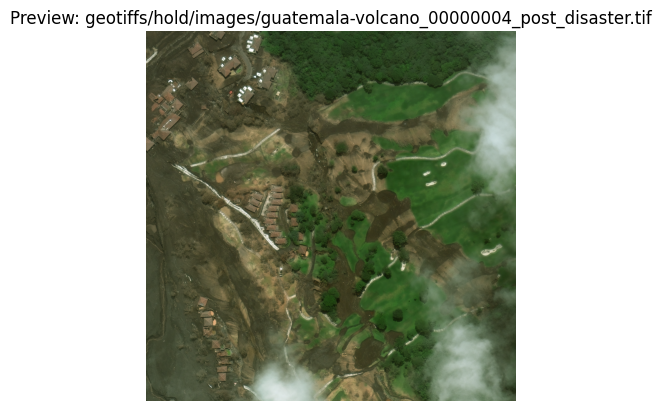

Pixel (row=100, col=100) -> Coordinate: (-90.83262558290012, 14.429294462794074)


In [17]:
import tarfile, rasterio, matplotlib.pyplot as plt

tif_path = None

# Step 1: Find and extract the first .tif
with fs.open('satellite_data_467812/xview2_geotiff.tgz.part-aa', 'rb') as f:
    with tarfile.open(fileobj=f, mode="r:gz") as tar:
        for member in tar:
            if member.name.endswith(".tif"):
                print("Found first .tif:", member.name)
                tar.extract(member, path=".")
                tif_path = member.name
                break

# Step 2: If extracted successfully, open it with rasterio
if tif_path:
    try:
        with rasterio.open(tif_path) as src:
            print("✅ Opened GeoTIFF")
            print("CRS:", src.crs)
            print("Bounds:", src.bounds)
            print("Resolution:", src.res)
            print("Width x Height:", src.width, "x", src.height)

            # Show image (first 3 bands if available)
            bands = [1, 2, 3] if src.count >= 3 else [1]
            img = src.read(bands)
            if len(bands) == 3:
                plt.imshow(img.transpose(1, 2, 0))
            else:
                plt.imshow(img[0], cmap="gray")
            plt.title(f"Preview: {tif_path}")
            plt.axis("off")
            plt.show()

            # Example: get coordinate of pixel (100,100)
            row, col = 100, 100
            x, y = src.xy(row, col)
            print(f"Pixel (row={row}, col={col}) -> Coordinate: ({x}, {y})")

    except Exception as e:
        print("⚠️ Error opening .tif (maybe incomplete in part-aa):", e)


In [18]:
import os
import glob

# Path to your geotiffs folder
folder_path = "geotiffs/hold/images"

# Find all .tif files
tif_files = glob.glob(os.path.join(folder_path, "*.tif"))

# Print count and first few filenames
print(f"Total number of .tif images: {len(tif_files)}")
print("Sample files:", tif_files[:5])  # show first 5 only


Total number of .tif images: 1
Sample files: ['geotiffs/hold/images/guatemala-volcano_00000004_post_disaster.tif']


Each TIF has one and its cordinates

#Extract + Organize + Save Metadata

In [20]:
import os, tarfile, rasterio, json, shutil

# Make output folders
os.makedirs("images/pre", exist_ok=True)
os.makedirs("images/post", exist_ok=True)

pre_count, post_count = 0, 0
max_images = 1000  # limit for each category

metadata = []

with fs.open('satellite_data_467812/xview2_geotiff.tgz.part-aa', 'rb') as f:
    with tarfile.open(fileobj=f, mode="r:gz") as tar:
        for member in tar:
            if not member.name.endswith(".tif"):
                continue

            base_name = os.path.basename(member.name)  # strip nested folders

            if "pre_disaster" in base_name and pre_count < max_images:
                out_path = os.path.join("images/pre", base_name)
                pre_count += 1
            elif "post_disaster" in base_name and post_count < max_images:
                out_path = os.path.join("images/post", base_name)
                post_count += 1
            else:
                continue

            # Extract and save manually
            extracted = tar.extractfile(member)
            if extracted:
                with open(out_path, "wb") as out_f:
                    shutil.copyfileobj(extracted, out_f)

                # Try reading with rasterio
                try:
                    with rasterio.open(out_path) as src:
                        meta = {
                            "filename": out_path,
                            "crs": str(src.crs),
                            "bounds": tuple(map(float, src.bounds)),
                            "resolution": tuple(map(float, src.res)),
                            "width": src.width,
                            "height": src.height,
                            "bands": src.count
                        }
                        metadata.append(meta)
                except Exception as e:
                    print("⚠️ Could not open", out_path, ":", e)

            if pre_count >= max_images and post_count >= max_images:
                break

# Save metadata
with open("image_metadata.json", "w") as f:
    json.dump(metadata, f, indent=2)

print(f"✅ Extracted {pre_count} pre-disaster and {post_count} post-disaster images")
print("📄 Metadata saved to image_metadata.json")


✅ Extracted 1000 pre-disaster and 1000 post-disaster images
📄 Metadata saved to image_metadata.json


# Diversity of dataset!
- We have a Post and Pre image , along with satelite cordinates!
- I have downloaded these locally - so pls rerun the code on collab as the file size exceeds 10GB and was mounted from google cloud bucket
- Guatemala volcano impacts, Hurricane florence, hurricane harvey, flash flood, hurricane - michael, mexico earthquake, midwest flooding, paulu tsunami, santa-rosa wildfire, social-fire

In [21]:
import random
import matplotlib.pyplot as plt

# Load metadata
with open("image_metadata.json", "r") as f:
    metadata = json.load(f)

# Separate pre and post lists
pre_images = [m for m in metadata if "pre" in m["filename"]]
post_images = [m for m in metadata if "post" in m["filename"]]

# Pick 10 random each
sample_pre = random.sample(pre_images, 10)
sample_post = random.sample(post_images, 10)

images/pre/hurricane-florence_00000087_pre_disaster.tif: Bounds=[-77.91835584465946, 34.54093119275727, -77.91365332803107, 34.545633709385655], CRS=EPSG:4326
images/pre/hurricane-florence_00000154_pre_disaster.tif: Bounds=[-77.95505902885368, 34.56957876736229, -77.9503552858661, 34.574282510349875], CRS=EPSG:4326
images/pre/socal-fire_00000829_pre_disaster.tif: Bounds=[-118.9233348721679, 34.03904034325558, -118.91864621546489, 34.04372899995859], CRS=EPSG:4326
images/pre/socal-fire_00000188_pre_disaster.tif: Bounds=[-118.85513679637866, 34.101242011707505, -118.8504485950267, 34.10593021305946], CRS=EPSG:4326
images/pre/midwest-flooding_00000155_pre_disaster.tif: Bounds=[-96.3658559682997, 36.25315906738188, -96.36118451762196, 36.25783051805961], CRS=EPSG:4326
images/pre/socal-fire_00000759_pre_disaster.tif: Bounds=[-118.81903614415509, 34.059028101501625, -118.81434780892435, 34.06371643673236], CRS=EPSG:4326
images/pre/socal-fire_00000047_pre_disaster.tif: Bounds=[-118.9166633254

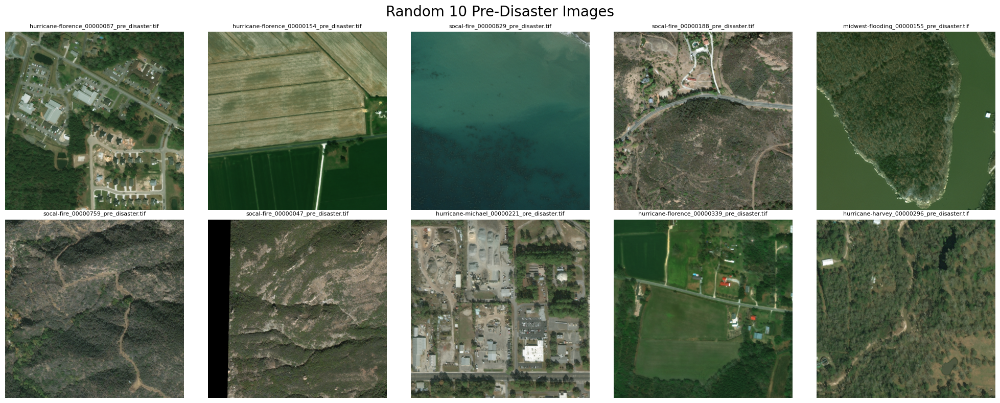

In [22]:

def show_images(samples, title):
    fig, axes = plt.subplots(2, 5, figsize=(20, 8))
    fig.suptitle(title, fontsize=20)

    for ax, meta in zip(axes.ravel(), samples):
        try:
            with rasterio.open(meta["filename"]) as src:
                bands = [1, 2, 3] if src.count >= 3 else [1]
                img = src.read(bands)
                if len(bands) == 3:
                    ax.imshow(img.transpose(1, 2, 0))
                else:
                    ax.imshow(img[0], cmap="gray")
                ax.set_title(os.path.basename(meta["filename"]), fontsize=8)
                ax.axis("off")

                # Print coordinates
                print(f"{meta['filename']}: Bounds={meta['bounds']}, CRS={meta['crs']}")
        except Exception as e:
            print("⚠️ Error reading", meta["filename"], ":", e)
            ax.axis("off")

    plt.tight_layout()
    plt.show()

# Show pre-disaster images
show_images(sample_pre, "Random 10 Pre-Disaster Images")

images/post/hurricane-michael_00000054_post_disaster.tif: Bounds=[-85.63955745493526, 30.09483791668648, -85.6349247073018, 30.099470664319924], CRS=EPSG:4326
images/post/socal-fire_00001100_post_disaster.tif: Bounds=[-118.77831380918337, 34.055394417506044, -118.77362586058425, 34.06008236610517], CRS=EPSG:4326
images/post/socal-fire_00001231_post_disaster.tif: Bounds=[-118.73143802343142, 34.07592819289786, -118.7267498433581, 34.08061637297118], CRS=EPSG:4326
images/post/hurricane-florence_00000234_post_disaster.tif: Bounds=[-77.9352589661428, 34.67483712468367, -77.93055357815166, 34.6795425126748], CRS=EPSG:4326
images/post/hurricane-harvey_00000032_post_disaster.tif: Bounds=[-95.6560031866211, 29.52784645100259, -95.65135126906631, 29.532498368557388], CRS=EPSG:4326
images/post/palu-tsunami_00000079_post_disaster.tif: Bounds=[119.84526054511652, -0.9111245847363353, 119.84985616578642, -0.9065289640664281], CRS=EPSG:4326
images/post/hurricane-michael_00000229_post_disaster.tif: B

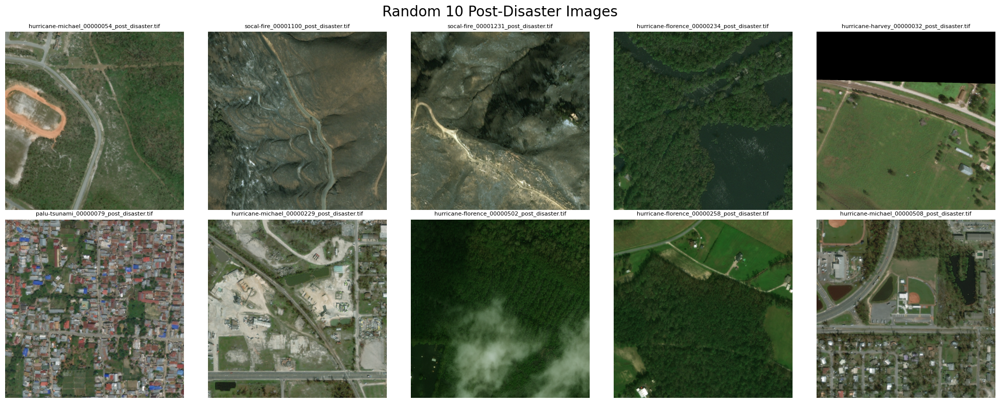

In [23]:
# Show post-disaster images
show_images(sample_post, "Random 10 Post-Disaster Images")

# Bounding Boxes for better visualisation!

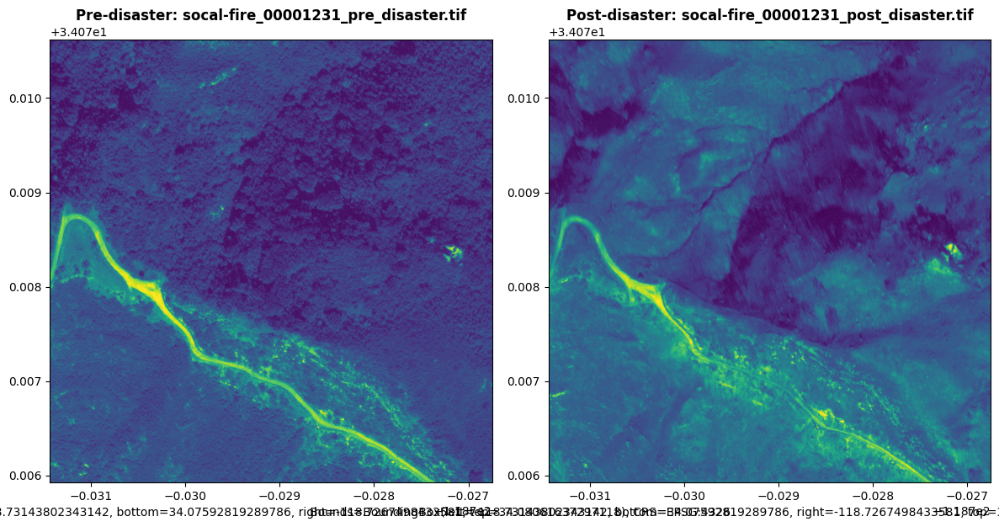

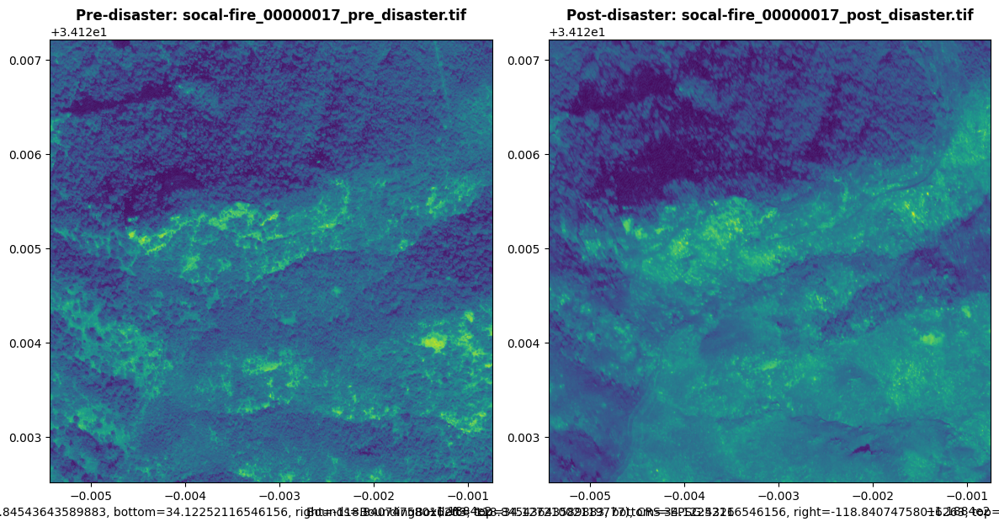

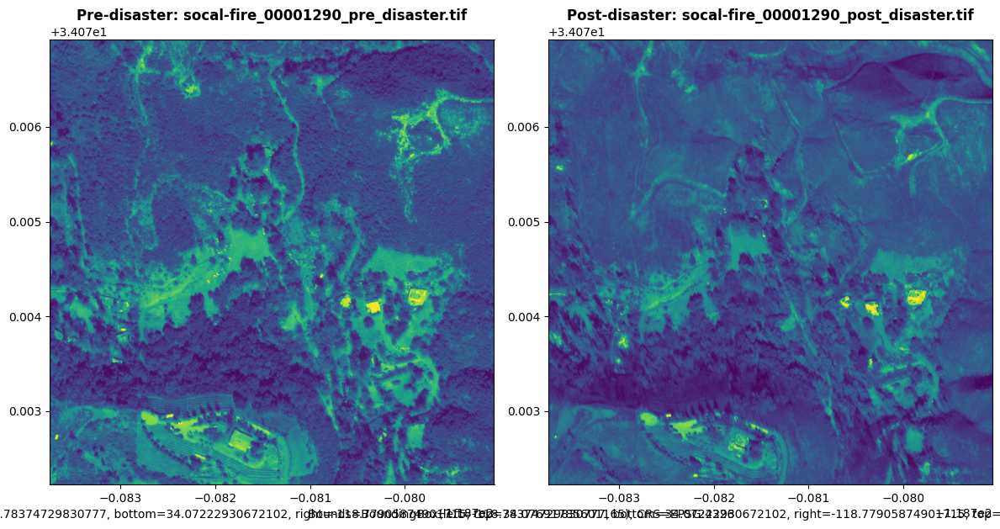

In [28]:
import os
import random
import rasterio
import matplotlib.pyplot as plt
from rasterio.plot import show

# Paths to pre & post image folders
pre_path = "images/pre"
post_path = "images/post"

# Match files by disaster id
pre_files = {f.split("_pre_disaster")[0]: os.path.join(pre_path, f)
             for f in os.listdir(pre_path) if f.endswith(".tif")}
post_files = {f.split("_post_disaster")[0]: os.path.join(post_path, f)
              for f in os.listdir(post_path) if f.endswith(".tif")}

# Find matching IDs
matching_ids = list(set(pre_files.keys()) & set(post_files.keys()))

# Randomly pick 3 matching pairs
sample_ids = random.sample(matching_ids, 3)

# Plot each pair with bounds
for idx in sample_ids:
    pre_file = pre_files[idx]
    post_file = post_files[idx]

    with rasterio.open(pre_file) as pre_ds, rasterio.open(post_file) as post_ds:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

        # Show pre-disaster image
        show(pre_ds, ax=ax1, title=f"Pre-disaster: {os.path.basename(pre_file)}")
        ax1.set_xlabel(f"Bounds={pre_ds.bounds}, CRS={pre_ds.crs}")

        # Show post-disaster image
        show(post_ds, ax=ax2, title=f"Post-disaster: {os.path.basename(post_file)}")
        ax2.set_xlabel(f"Bounds={post_ds.bounds}, CRS={post_ds.crs}")

        plt.tight_layout()
        plt.show()


sample meta deta!



    "filename": "images/pre/guatemala-volcano_00000004_pre_disaster.tif",
    "crs": "EPSG:4326",
    "bounds": [
      -90.83307662397137,
      14.425149821706515,
      -90.82848094181256,
      14.429745503865325
    ],
    "resolution": [
      4.4879708582127425e-06,
      4.4879708582127425e-06
    ],
    "width": 1024,
    "height": 1024,
    "bands": 3
  },

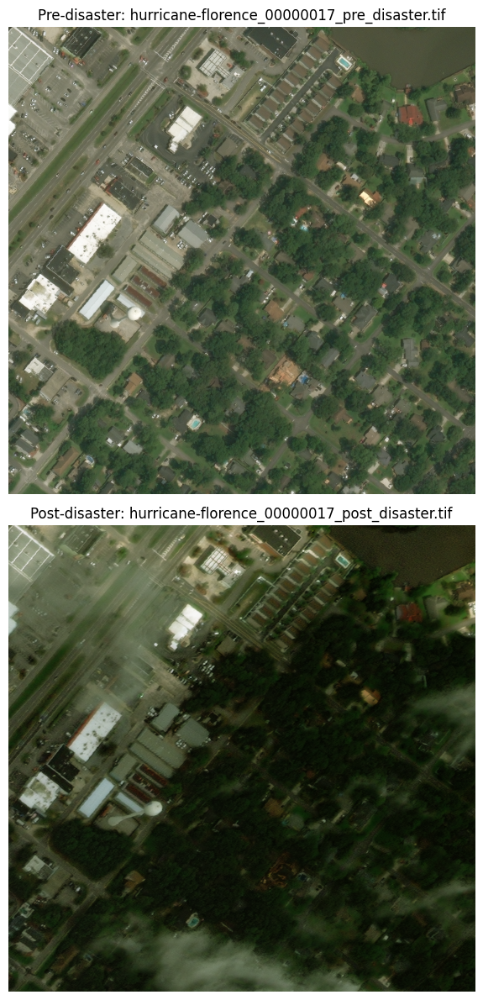

In [41]:
import os
import random
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# Paths to pre & post image folders
pre_path = "images/pre"
post_path = "images/post"

# Match files by disaster id
pre_files = {f.split("_pre_disaster")[0]: os.path.join(pre_path, f)
             for f in os.listdir(pre_path) if f.endswith(".tif")}
post_files = {f.split("_post_disaster")[0]: os.path.join(post_path, f)
              for f in os.listdir(post_path) if f.endswith(".tif")}

# Find matching IDs
matching_ids = list(set(pre_files.keys()) & set(post_files.keys()))

# Randomly pick 1 matching pair
sample_id = random.choice(matching_ids)

pre_file = pre_files[sample_id]
post_file = post_files[sample_id]

def read_as_rgb(path):
    """Read GeoTIFF and return RGB numpy array."""
    with rasterio.open(path) as ds:
        # Ensure we only use first 3 bands (R,G,B)
        img = ds.read([1, 2, 3])
        img = np.transpose(img, (1, 2, 0))  # [H, W, C]
        # Normalize for plotting
        img = (img - img.min()) / (img.max() - img.min())
        bounds, crs = ds.bounds, ds.crs
    return img, bounds, crs

# Read pre and post images
pre_img, pre_bounds, pre_crs = read_as_rgb(pre_file)
post_img, post_bounds, post_crs = read_as_rgb(post_file)

# Plot vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 12))

# Pre-disaster
ax1.imshow(pre_img)
ax1.set_title(f"Pre-disaster: {os.path.basename(pre_file)}")
ax1.axis("off")
ax1.set_xlabel(f"Bounds={pre_bounds}, CRS={pre_crs}")

# Post-disaster
ax2.imshow(post_img)
ax2.set_title(f"Post-disaster: {os.path.basename(post_file)}")
ax2.axis("off")
ax2.set_xlabel(f"Bounds={post_bounds}, CRS={post_crs}")

plt.tight_layout()
plt.show()


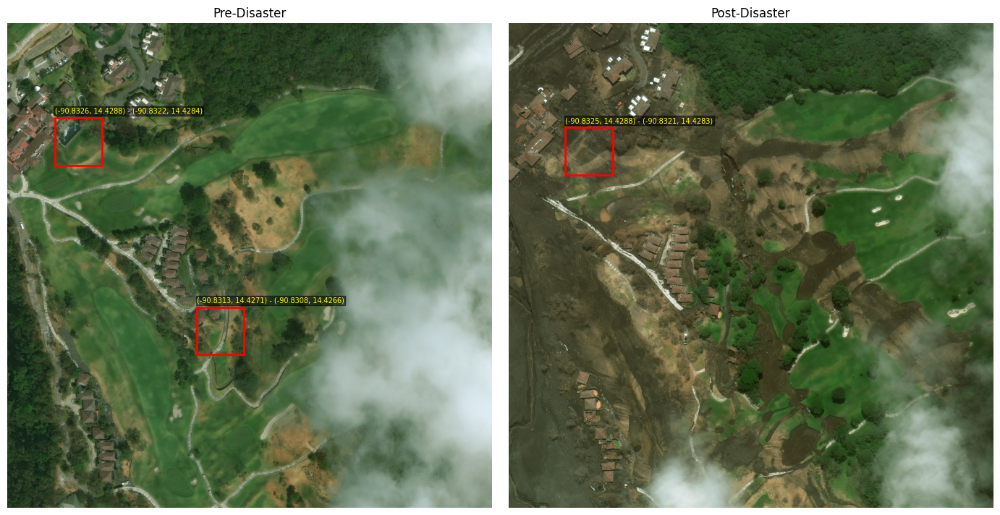

In [42]:
import json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import rasterio

# --- Load Metadata ---
metadata = {
    "filename": "images/pre/guatemala-volcano_00000004_pre_disaster.tif",
    "crs": "EPSG:4326",
    "bounds": [
        -90.83307662397137,
        14.425149821706515,
        -90.82848094181256,
        14.429745503865325
    ],
    "resolution": [
        4.4879708582127425e-06,
        4.4879708582127425e-06
    ],
    "width": 1024,
    "height": 1024,
    "bands": 3
}

# Example bounding boxes (pixel coordinates)
# Format: {"filename": <file>, "boxes": [[xmin, ymin, xmax, ymax], ...]}
annotations = {
    "images/pre/guatemala-volcano_00000004_pre_disaster.tif": [
        [100, 200, 200, 300],
        [400, 600, 500, 700]
    ],
    "images/post/guatemala-volcano_00000004_post_disaster.tif": [
        [120, 220, 220, 320]
    ]
}

# --- Helper: convert pixel → geo coordinates ---
def pixel_to_geo(x, y, metadata):
    minx, miny, maxx, maxy = metadata["bounds"]
    width, height = metadata["width"], metadata["height"]

    lon = minx + (x / width) * (maxx - minx)
    lat = maxy - (y / height) * (maxy - miny)  # flip Y
    return lon, lat

# --- Plot function ---
def plot_with_boxes(pre_path, post_path, annotations, metadata):
    fig, axes = plt.subplots(1, 2, figsize=(14, 7))

    for ax, img_path, title in zip(
        axes, [pre_path, post_path], ["Pre-Disaster", "Post-Disaster"]
    ):
        with rasterio.open(img_path) as src:
            img = src.read([1, 2, 3])  # RGB
            img = img.transpose(1, 2, 0)  # HWC

        ax.imshow(img)
        ax.set_title(title)
        ax.axis("off")

        if img_path in annotations:
            for box in annotations[img_path]:
                xmin, ymin, xmax, ymax = box
                # draw rectangle
                rect = patches.Rectangle(
                    (xmin, ymin),
                    xmax - xmin,
                    ymax - ymin,
                    linewidth=2,
                    edgecolor="red",
                    facecolor="none"
                )
                ax.add_patch(rect)

                # get geo-coordinates of top-left & bottom-right
                lon1, lat1 = pixel_to_geo(xmin, ymin, metadata)
                lon2, lat2 = pixel_to_geo(xmax, ymax, metadata)

                ax.text(
                    xmin,
                    ymin - 10,
                    f"({lon1:.4f}, {lat1:.4f}) - ({lon2:.4f}, {lat2:.4f})",
                    color="yellow",
                    fontsize=7,
                    bbox=dict(facecolor="black", alpha=0.5, pad=1)
                )

    plt.tight_layout()
    plt.show()


# --- Run ---
plot_with_boxes(
    "images/pre/guatemala-volcano_00000004_pre_disaster.tif",
    "images/post/guatemala-volcano_00000004_post_disaster.tif",
    annotations,
    metadata
)


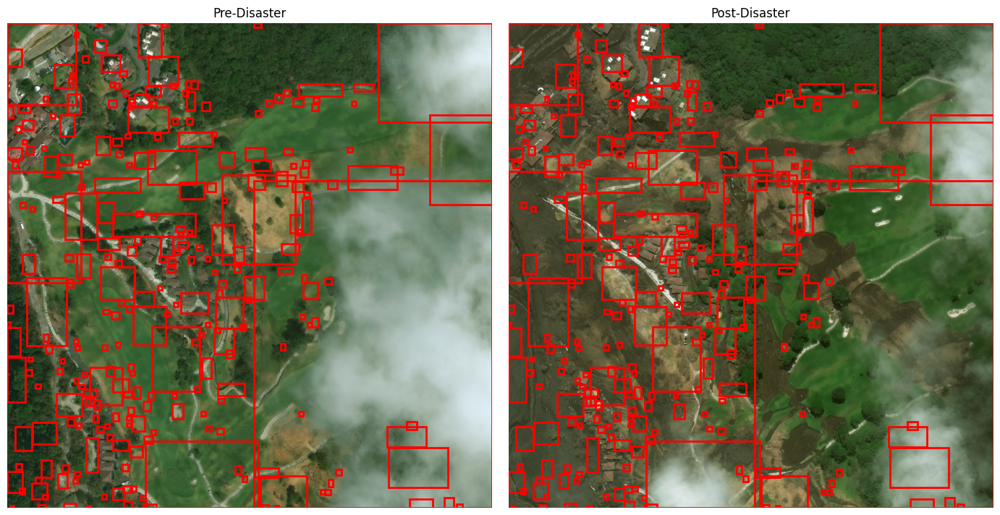

In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import rasterio

# --- Load pre & post images ---
pre_file = "images/pre/guatemala-volcano_00000004_pre_disaster.tif"
post_file = "images/post/guatemala-volcano_00000004_post_disaster.tif"

with rasterio.open(pre_file) as pre_ds, rasterio.open(post_file) as post_ds:
    pre_img = pre_ds.read([1, 2, 3]).transpose(1, 2, 0).astype(np.float32)
    post_img = post_ds.read([1, 2, 3]).transpose(1, 2, 0).astype(np.float32)

# --- Normalize ---
pre_img /= pre_img.max()
post_img /= post_img.max()

# --- Compute absolute difference ---
diff = cv2.absdiff(pre_img, post_img)
gray_diff = cv2.cvtColor((diff * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)

# --- Threshold to detect change ---
_, thresh = cv2.threshold(gray_diff, 30, 255, cv2.THRESH_BINARY)

# --- Morphology to clean noise ---
kernel = np.ones((5,5), np.uint8)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_DILATE, kernel)

# --- Find contours (changed regions) ---
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# --- Plot results ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

for ax, img, title in zip([ax1, ax2], [pre_img, post_img], ["Pre-Disaster", "Post-Disaster"]):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis("off")

    # Draw bounding boxes
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor="red", facecolor="none")
        ax.add_patch(rect)

plt.tight_layout()
plt.show()


In [ ]:
import os, random, json
import numpy as np
import rasterio
from rasterio.transform import xy
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2

# =========================
# Config
# =========================
PRE_DIR  = "images/pre"
POST_DIR = "images/post"
BASE_ID  = None           # e.g. "guatemala-volcano_00000004" (leave None to pick randomly)
TOP_K_BOXES = 6           # keep at most this many largest boxes
MIN_AREA_PX = 5000        # remove tiny blobs before boxing
DILATE_ITER = 3           # bigger => fewer, larger regions
PAD_FRAC    = 0.08        # enlarge each box by this fraction
SEVERITY_THRESHOLDS = (0.25, 0.55)  # (low/med, med/high) on normalized intensity
# =========================


In [ ]:
def find_one_pair(pre_dir, post_dir, base_id=None):
    pre_map  = {f.replace("_pre_disaster.tif",""): os.path.join(pre_dir, f)
                for f in os.listdir(pre_dir)  if f.endswith(".tif")}
    post_map = {f.replace("_post_disaster.tif",""): os.path.join(post_dir, f)
                for f in os.listdir(post_dir) if f.endswith(".tif")}
    keys = sorted(set(pre_map) & set(post_map))
    if not keys:
        raise RuntimeError("No matching pre/post pairs found.")
    key = base_id if base_id in keys else random.choice(keys) if base_id is None else None
    if key is None:
        raise RuntimeError(f"Requested base_id '{base_id}' not found. Available examples: {keys[:5]} ...")
    return key, pre_map[key], post_map[key]

def read_rgb(path):
    with rasterio.open(path) as ds:
        arr = ds.read([1,2,3]).astype(np.float32)  # (C,H,W)
        arr = np.transpose(arr, (1,2,0))          # (H,W,C)
        # robust per-channel stretch (2-98 percentile)
        out = np.zeros_like(arr, dtype=np.float32)
        for c in range(3):
            p2, p98 = np.percentile(arr[...,c], [2, 98])
            if p98 > p2:
                ch = np.clip((arr[...,c]-p2)/(p98-p2), 0, 1)
            else:
                ch = np.zeros_like(arr[...,c])
            out[...,c] = ch
    return out

def change_mask(pre_rgb, post_rgb, min_area_px=MIN_AREA_PX, dilate_iter=DILATE_ITER):
    # intensity: average absolute difference across RGB
    diff = np.mean(np.abs(post_rgb - pre_rgb), axis=2)  # (H,W), 0..1 approx after stretch

    # smooth to reduce noise
    diff_blur = cv2.GaussianBlur(diff, (0,0), 1.2)

    # auto threshold by percentile for fewer blobs
    t = np.percentile(diff_blur, 85)
    mask = (diff_blur >= t).astype(np.uint8) * 255

    # morphology to merge nearby regions -> fewer, bigger blobs
    kernel = np.ones((7,7), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=1)
    mask = cv2.dilate(mask, kernel, iterations=dilate_iter)

    # remove small components
    n, labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
    keep = np.zeros_like(mask)
    for i in range(1, n):
        area = stats[i, cv2.CC_STAT_AREA]
        if area >= min_area_px:
            keep[labels==i] = 255
    return keep, diff_blur

def boxes_from_mask(mask, top_k=TOP_K_BOXES, pad_frac=PAD_FRAC):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    rects = []
    H, W = mask.shape[:2]
    for c in contours:
        x,y,w,h = cv2.boundingRect(c)
        # pad box a bit
        pad_w, pad_h = int(w*pad_frac), int(h*pad_frac)
        x0 = max(0, x - pad_w)
        y0 = max(0, y - pad_h)
        x1 = min(W, x + w + pad_w)
        y1 = min(H, y + h + pad_h)
        rects.append((x0,y0,x1,y1))
    # sort by area desc and keep top_k
    rects = sorted(rects, key=lambda r: (r[2]-r[0])*(r[3]-r[1]), reverse=True)[:top_k]
    return rects

def score_severity(diff_blur, box):
    x0,y0,x1,y1 = box
    roi = diff_blur[y0:y1, x0:x1]
    if roi.size == 0:
        return 0.0
    # normalized mean intensity in box (0..1); robustify by 99th percentile cap
    cap = np.percentile(diff_blur, 99)
    norm = np.clip(roi / (cap + 1e-6), 0, 1)
    return float(np.mean(norm))

def severity_to_color(sev, th=(0.25, 0.55)):
    if sev < th[0]:
        return "yellow", "low"
    elif sev < th[1]:
        return "orange", "medium"
    else:
        return "red", "high"

def pixel_box_to_geo(ds, box):
    # box in pixel coords -> geographic (lon/lat) for corners
    x0,y0,x1,y1 = box
    # rasterio uses (row, col) = (y, x)
    lon0, lat0 = xy(ds.transform, y0, x0)  # top-left
    lon1, lat1 = xy(ds.transform, y1, x1)  # bottom-right
    # ensure order is (minx,miny,maxx,maxy)
    minx, maxx = sorted([lon0, lon1])
    miny, maxy = sorted([lat0, lat1])
    return (minx, miny, maxx, maxy)


Using pair: santa-rosa-wildfire_00000120
  pre : images/pre/santa-rosa-wildfire_00000120_pre_disaster.tif
  post: images/post/santa-rosa-wildfire_00000120_post_disaster.tif


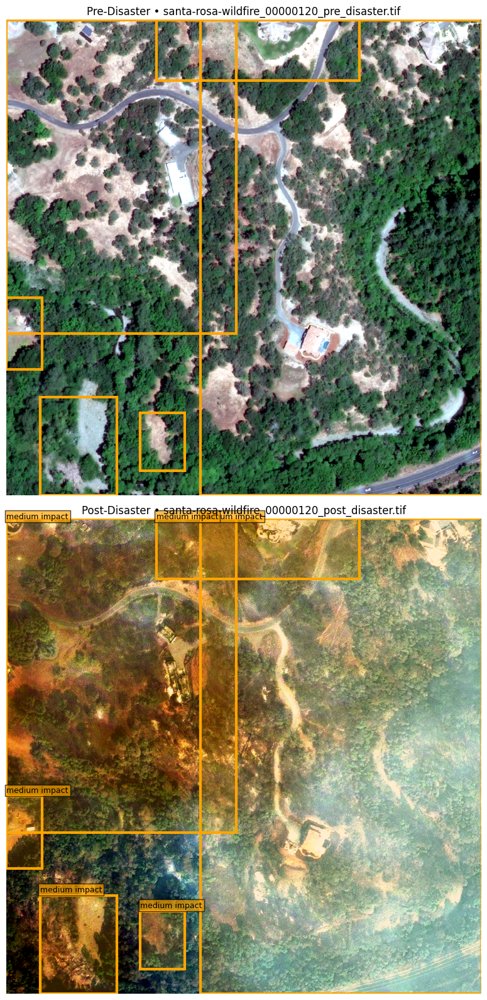


Detected impact regions (fewer, larger boxes):
[1] pixel_box=(x0=419, y0=0, x1=1024, y1=1024)  geo_box=(minLon=-122.728917, minLat=38.504967, maxLon=-122.726125, maxLat=38.509693)
[2] pixel_box=(x0=0, y0=0, x1=496, y1=676)  geo_box=(minLon=-122.730851, minLat=38.506573, maxLon=-122.728562, maxLat=38.509693)
[3] pixel_box=(x0=323, y0=0, x1=761, y1=130)  geo_box=(minLon=-122.729360, minLat=38.509093, maxLon=-122.727339, maxLat=38.509693)
[4] pixel_box=(x0=73, y0=812, x1=238, y1=1024)  geo_box=(minLon=-122.730514, minLat=38.504967, maxLon=-122.729752, maxLat=38.505945)
[5] pixel_box=(x0=0, y0=598, x1=77, y1=753)  geo_box=(minLon=-122.730851, minLat=38.506218, maxLon=-122.730495, maxLat=38.506933)
[6] pixel_box=(x0=289, y0=846, x1=384, y1=971)  geo_box=(minLon=-122.729517, minLat=38.505212, maxLon=-122.729079, maxLat=38.505789)


In [50]:

# -------- main --------
base_id, pre_path, post_path = find_one_pair(PRE_DIR, POST_DIR, BASE_ID)
print(f"Using pair: {base_id}\n  pre : {pre_path}\n  post: {post_path}")

# Read display-ready RGB
pre_rgb  = read_rgb(pre_path)
post_rgb = read_rgb(post_path)

# Build change mask and big regions
mask, diff_blur = change_mask(pre_rgb, post_rgb)
rects = boxes_from_mask(mask)

# For geo export, open post (we’ll report post-geo boxes)
post_ds = rasterio.open(post_path)

# Plot vertically: Pre over Post
fig, axes = plt.subplots(2, 1, figsize=(12, 16))

# --- PRE ---
axes[0].imshow(pre_rgb)
axes[0].set_title(f"Pre-Disaster • {os.path.basename(pre_path)}")
axes[0].axis("off")

# --- POST + boxes ---
axes[1].imshow(post_rgb)
axes[1].set_title(f"Post-Disaster • {os.path.basename(post_path)}")
axes[1].axis("off")

# draw boxes on both for visual alignment
for box in rects:
    sev_score = score_severity(diff_blur, box)
    color, label = severity_to_color(sev_score, SEVERITY_THRESHOLDS)

    x0,y0,x1,y1 = box
    w,h = x1-x0, y1-y0

    for ax in axes:  # draw on both pre and post for easy comparison
        rect = patches.Rectangle((x0,y0), w, h, linewidth=3,
                                 edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        # semi-transparent fill on POST only (easier to see)
        if ax is axes[1]:
            rect_fill = patches.Rectangle((x0,y0), w, h, linewidth=0,
                                          edgecolor=None, facecolor=color, alpha=0.18)
            ax.add_patch(rect_fill)
            ax.text(x0, max(0,y0-8), f"{label} impact",
                    fontsize=9, color="black",
                    bbox=dict(facecolor=color, alpha=0.7, pad=2))

plt.tight_layout()
plt.show()

# Print box coordinates in both pixel and geographic terms
print("\nDetected impact regions (fewer, larger boxes):")
for i, box in enumerate(rects, 1):
    x0,y0,x1,y1 = box
    geo = pixel_box_to_geo(post_ds, box)
    print(f"[{i}] pixel_box=(x0={x0}, y0={y0}, x1={x1}, y1={y1})  "
          f"geo_box=(minLon={geo[0]:.6f}, minLat={geo[1]:.6f}, "
          f"maxLon={geo[2]:.6f}, maxLat={geo[3]:.6f})")
post_ds.close()


# DCG GAN

In [52]:
# === deps (Colab has torch, but keep for completeness) ===
# !pip install -q rasterio pillow tqdm torchvision torch

import os, glob, math, random
from pathlib import Path

import numpy as np
import rasterio
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import save_image, make_grid

from PIL import Image
from tqdm import tqdm

# =========================
# Config
# =========================
DATA_DIRS    = ["images/pre", "images/post"]   # both sets (unconditional)
IMAGE_SIZE   = 128                              # 64/128/256 (DCGAN likes powers of 2)
BATCH_SIZE   = 64
EPOCHS       = 2
NZ           = 100                              # latent dim
NGF          = 64                               # generator feature maps
NDF          = 64                               # discriminator feature maps
LR           = 2e-4
BETA1        = 0.5                              # Adam beta1
NUM_WORKERS  = 2
SAMPLES_EVERY= 500                              # steps
DEVICE       = "cuda" if torch.cuda.is_available() else "cpu"
OUT_DIR      = "dcgan_out"
SEED         = 1337
random.seed(SEED); torch.manual_seed(SEED); np.random.seed(SEED)
os.makedirs(OUT_DIR, exist_ok=True); os.makedirs(f"{OUT_DIR}/samples", exist_ok=True)
print("Device:", DEVICE)

# =========================
# Dataset
# =========================
class GeoTiffFolderDataset(Dataset):
    def __init__(self, roots, size=128, limit=None):
        self.paths = []
        for r in roots:
            if not os.path.isdir(r):
                continue
            self.paths += sorted(glob.glob(os.path.join(r, "*.tif")))
        if limit:
            self.paths = self.paths[:limit]
        self.size = size

    def __len__(self):
        return len(self.paths)

    def _read_rgb_tiff(self, path):
        # Read bands 1,2,3 as RGB using rasterio (avoid BGR mixups)
        with rasterio.open(path) as ds:
            arr = ds.read([1,2,3])  # (C,H,W)
        # to HWC float32 in [0,1]
        img = np.moveaxis(arr, 0, -1).astype(np.float32)
        # robust per-channel 2–98% stretch to stabilize contrast
        for c in range(3):
            p2, p98 = np.percentile(img[...,c], [2, 98])
            if p98 > p2:
                img[...,c] = np.clip((img[...,c] - p2)/(p98-p2), 0, 1)
            else:
                img[...,c] = 0.5
        return img  # H,W,C float32 [0,1]

    def __getitem__(self, idx):
        p = self.paths[idx]
        img = self._read_rgb_tiff(p)
        # resize with PIL (bilinear)
        pil = Image.fromarray((img*255).astype(np.uint8))
        pil = pil.resize((self.size, self.size), Image.BILINEAR)
        arr = np.asarray(pil).astype(np.float32) / 255.0
        # to torch CHW and normalize to [-1,1]
        t = torch.from_numpy(arr).permute(2,0,1)        # C,H,W
        t = t*2.0 - 1.0
        return t

# =========================
# DCGAN models
# =========================
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        if getattr(m, "bias", None) is not None:
            nn.init.zeros_(m.bias.data)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.zeros_(m.bias.data)

class Generator(nn.Module):
    def __init__(self, nz=100, ngf=64, nc=3, out_size=IMAGE_SIZE):
        super().__init__()
        # Build layers to hit out_size using ConvTranspose2d
        # Start from 4x4 and upsample x2 each block until IMAGE_SIZE
        layers = []
        size = 4
        c_in = nz
        c = ngf * 8
        # 4x4
        layers += [
            nn.ConvTranspose2d(c_in, c, 4, 1, 0, bias=False),
            nn.BatchNorm2d(c), nn.ReLU(True)
        ]
        size = 4
        while size < out_size:
            c_next = max(ngf, c // 2)
            layers += [
                nn.ConvTranspose2d(c, c_next, 4, 2, 1, bias=False),
                nn.BatchNorm2d(c_next), nn.ReLU(True)
            ]
            c = c_next
            size *= 2
        # To RGB with tanh
        layers += [nn.Conv2d(c, nc, 3, 1, 1, bias=False), nn.Tanh()]
        self.net = nn.Sequential(*layers)

    def forward(self, z):
        return self.net(z)

class Discriminator(nn.Module):
    def __init__(self, ndf=64, nc=3, in_size=IMAGE_SIZE):
        super().__init__()
        # Downsample with Conv2d stride 2, LeakyReLU, BN
        layers = []
        c = ndf
        # first block (no BN)
        layers += [nn.Conv2d(nc, c, 4, 2, 1, bias=False), nn.LeakyReLU(0.2, inplace=True)]
        size = in_size // 2
        while size > 4:
            c_next = min(512, c*2)
            layers += [
                nn.Conv2d(c, c_next, 4, 2, 1, bias=False),
                nn.BatchNorm2d(c_next),
                nn.LeakyReLU(0.2, inplace=True)
            ]
            c = c_next
            size //= 2
        # final 4x4 -> 1
        layers += [nn.Conv2d(c, 1, 4, 1, 0, bias=False), nn.Sigmoid()]
        self.net = nn.Sequential(*layers)

    def forward(self, x):
        return self.net(x).view(-1, 1).squeeze(1)

# =========================
# Data
# =========================
ds = GeoTiffFolderDataset(DATA_DIRS, size=IMAGE_SIZE)
if len(ds) == 0:
    raise RuntimeError("No .tif files found under images/pre and images/post")

dl = DataLoader(ds, batch_size=BATCH_SIZE, shuffle=True,
                num_workers=NUM_WORKERS, pin_memory=True, drop_last=True)
print(f"Dataset size: {len(ds)} images")

# =========================
# Train
# =========================
G = Generator(nz=NZ, ngf=NGF).to(DEVICE)
D = Discriminator(ndf=NDF).to(DEVICE)
G.apply(weights_init); D.apply(weights_init)

criterion = nn.BCELoss()
optD = torch.optim.Adam(D.parameters(), lr=LR, betas=(BETA1, 0.999))
optG = torch.optim.Adam(G.parameters(), lr=LR, betas=(BETA1, 0.999))

fixed_z = torch.randn(64, NZ, 1, 1, device=DEVICE)

step = 0
for epoch in range(1, EPOCHS+1):
    pbar = tqdm(dl, desc=f"Epoch {epoch}/{EPOCHS}")
    for real in pbar:
        real = real.to(DEVICE, non_blocking=True)
        bsz = real.size(0)
        # Labels
        ones  = torch.ones(bsz, device=DEVICE)
        zeros = torch.zeros(bsz, device=DEVICE)

        # -----------------
        # Train D: maximize log(D(x)) + log(1-D(G(z)))
        # -----------------
        D.zero_grad(set_to_none=True)
        pred_real = D(real)
        loss_real = criterion(pred_real, ones)

        z = torch.randn(bsz, NZ, 1, 1, device=DEVICE)
        fake = G(z).detach()
        pred_fake = D(fake)
        loss_fake = criterion(pred_fake, zeros)

        loss_D = loss_real + loss_fake
        loss_D.backward()
        optD.step()

        # -----------------
        # Train G: maximize log(D(G(z)))  (i.e., fool D)
        # -----------------
        G.zero_grad(set_to_none=True)
        z = torch.randn(bsz, NZ, 1, 1, device=DEVICE)
        fake = G(z)
        pred = D(fake)
        loss_G = criterion(pred, ones)
        loss_G.backward()
        optG.step()

        step += 1
        pbar.set_postfix(loss_D=f"{loss_D.item():.3f}", loss_G=f"{loss_G.item():.3f}")

        if step % SAMPLES_EVERY == 0:
            with torch.no_grad():
                samples = G(fixed_z).cpu()
            # de-normalize from [-1,1] to [0,1]
            samples = (samples + 1) / 2
            grid = make_grid(samples, nrow=8, padding=2)
            save_image(grid, f"{OUT_DIR}/samples/epoch{epoch:02d}_step{step:06d}.png")

    # save at end of epoch
    torch.save({
        "G": G.state_dict(),
        "D": D.state_dict(),
        "optG": optG.state_dict(),
        "optD": optD.state_dict(),
        "epoch": epoch,
        "config": {
            "IMAGE_SIZE": IMAGE_SIZE, "NZ": NZ, "NGF": NGF, "NDF": NDF
        }
    }, f"{OUT_DIR}/ckpt_epoch{epoch:02d}.pt")

print("Training complete. Check:", OUT_DIR)


Device: cuda
Dataset size: 2000 images


Epoch 2/2: 100%|██████████| 31/31 [03:05<00:00,  5.97s/it, loss_D=1.523, loss_G=5.322]


Training complete. Check: dcgan_out


# pix2pix

In [ ]:
# %%capture
# !pip install -q rasterio tqdm

import os, glob, random, shutil, zipfile
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import rasterio
from tqdm import tqdm

# =========================
# Config
# =========================
PRE_DIR       = "images/pre"
POST_DIR      = "images/post"
IMG_SIZE      = 256
BATCH_SIZE    = 4
EPOCHS        = 2
LR            = 2e-4
LAMBDA_L1     = 100.0
LIMIT_FILES   = None    # e.g., 200 for quick run
SEED          = 1337
OUT_DIR       = "pix2pix_out"
os.makedirs(OUT_DIR, exist_ok=True)
tf.random.set_seed(SEED); np.random.seed(SEED); random.seed(SEED)

# =========================
# Pair matching (by id)
# =========================
def match_pairs(pre_dir, post_dir):
    pre = {os.path.basename(p).replace("_pre_disaster.tif",""): p
           for p in glob.glob(os.path.join(pre_dir, "*.tif"))}
    post = {os.path.basename(p).replace("_post_disaster.tif",""): p
            for p in glob.glob(os.path.join(post_dir, "*.tif"))}
    keys = sorted(set(pre) & set(post))
    pairs = [(pre[k], post[k]) for k in keys]
    if LIMIT_FILES:
        pairs = pairs[:LIMIT_FILES]
    if not pairs:
        raise RuntimeError("No paired pre/post TIFFs found.")
    return pairs

pairs = match_pairs(PRE_DIR, POST_DIR)
print(f"Paired samples: {len(pairs)}")

# =========================
# IO: read GeoTIFF RGB (bands 1,2,3) → float32 [0,1]
# =========================
def read_rgb_tif(path):
    with rasterio.open(path) as ds:
        img = ds.read([1,2,3]).astype(np.float32)  # (C,H,W)
    img = np.moveaxis(img, 0, -1)  # (H,W,C)
    # robust 2–98% per-channel stretch to stabilize contrast
    for c in range(3):
        p2, p98 = np.percentile(img[...,c], [2, 98])
        if p98 > p2:
            img[...,c] = np.clip((img[...,c]-p2)/(p98-p2), 0, 1)
        else:
            img[...,c] = 0.5
    return img

# =========================
# tf.data pipeline
# =========================
def gen_pairs():
    for a,b in pairs:
        pre  = read_rgb_tif(a)
        post = read_rgb_tif(b)
        yield pre, post

out_sig = (tf.TensorSpec(shape=(None, None, 3), dtype=tf.float32),
           tf.TensorSpec(shape=(None, None, 3), dtype=tf.float32))
ds = tf.data.Dataset.from_generator(gen_pairs, output_signature=out_sig)

def _prep(pre, post):
    pre  = tf.image.resize(pre,  (IMG_SIZE, IMG_SIZE), method="bilinear")
    post = tf.image.resize(post, (IMG_SIZE, IMG_SIZE), method="bilinear")
    # normalize to [-1, 1]
    pre  = pre*2. - 1.
    post = post*2. - 1.
    return pre, post

ds = ds.shuffle(buffer_size=min(1000, len(pairs))).map(_prep, num_parallel_calls=tf.data.AUTOTUNE)
ds = ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# =========================
# Pix2Pix models: U-Net G & 70x70 PatchGAN D
# =========================
def down_block(x, filters, apply_norm=True):
    x = layers.Conv2D(filters, 4, strides=2, padding="same", use_bias=not apply_norm)(x)
    if apply_norm: x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)
    return x

def up_block(x, skip, filters, dropout=False):
    x = layers.Conv2DTranspose(filters, 4, strides=2, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    if dropout: x = layers.Dropout(0.5)(x)
    x = layers.Activation("relu")(x)
    x = layers.Concatenate()([x, skip])
    return x

def build_generator(img_size=256, in_ch=3, out_ch=3):
    inputs = layers.Input(shape=(img_size, img_size, in_ch))
    # Encoder
    d1 = down_block(inputs, 64,  apply_norm=False)  # 128
    d2 = down_block(d1,    128)                     # 64
    d3 = down_block(d2,    256)                     # 32
    d4 = down_block(d3,    512)                     # 16
    d5 = down_block(d4,    512)                     # 8
    d6 = down_block(d5,    512)                     # 4
    d7 = down_block(d6,    512)                     # 2
    d8 = down_block(d7,    512)                     # 1

    # Decoder
    u1 = up_block(d8, d7, 512, dropout=True)        # 2
    u2 = up_block(u1, d6, 512, dropout=True)        # 4
    u3 = up_block(u2, d5, 512, dropout=True)        # 8
    u4 = up_block(u3, d4, 512)                      # 16
    u5 = up_block(u4, d3, 256)                      # 32
    u6 = up_block(u5, d2, 128)                      # 64
    u7 = up_block(u6, d1, 64)                       # 128
    u8 = layers.Conv2DTranspose(out_ch, 4, strides=2, padding="same")(u7)  # 256
    outputs = layers.Activation("tanh")(u8)
    return keras.Model(inputs, outputs, name="pix2pix_generator")

def build_discriminator(img_size=256, ch=3):
    inp  = layers.Input(shape=(img_size, img_size, ch), name="input_image")
    targ = layers.Input(shape=(img_size, img_size, ch), name="target_image")
    x = layers.Concatenate()([inp, targ])  # channel-wise concat

    x = layers.Conv2D(64, 4, strides=2, padding="same")(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(128, 4, strides=2, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x); x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(256, 4, strides=2, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x); x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(512, 4, strides=1, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x); x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(1, 4, strides=1, padding="same")(x)  # Patch logits
    return keras.Model([inp, targ], x, name="pix2pix_discriminator")

G = build_generator(IMG_SIZE)
D = build_discriminator(IMG_SIZE)
bce = keras.losses.BinaryCrossentropy(from_logits=True)

# =========================
# Train step
# =========================
gen_opt = keras.optimizers.Adam(LR, beta_1=0.5)
disc_opt= keras.optimizers.Adam(LR, beta_1=0.5)

@tf.function
def train_step(pre_img, post_img):
    # real labels are ones; fake are zeros
    real_lbl = tf.ones((tf.shape(pre_img)[0],) + D([pre_img, post_img]).shape[1:])
    fake_lbl = tf.zeros_like(real_lbl)

    with tf.GradientTape(persistent=True) as tape:
        fake_post = G(pre_img, training=True)

        # Discriminator loss
        pred_real = D([pre_img, post_img], training=True)
        pred_fake = D([pre_img, fake_post], training=True)
        d_loss_real = bce(real_lbl, pred_real)
        d_loss_fake = bce(fake_lbl, pred_fake)
        d_loss = (d_loss_real + d_loss_fake) * 0.5

        # Generator loss = GAN + L1
        pred_fake_for_g = D([pre_img, fake_post], training=True)
        g_gan = bce(real_lbl, pred_fake_for_g)
        g_l1  = tf.reduce_mean(tf.abs(post_img - fake_post))
        g_loss = g_gan + LAMBDA_L1 * g_l1

    g_grads = tape.gradient(g_loss, G.trainable_variables)
    d_grads = tape.gradient(d_loss, D.trainable_variables)
    gen_opt.apply_gradients(zip(g_grads, G.trainable_variables))
    disc_opt.apply_gradients(zip(d_grads, D.trainable_variables))
    return g_loss, d_loss, g_l1

# =========================
# Training loop + saving
# =========================
sample_pre, sample_post = next(iter(ds.take(1)))
ckpt_dir = os.path.join(OUT_DIR, "checkpoints")
os.makedirs(ckpt_dir, exist_ok=True)
ckpt = tf.train.Checkpoint(G=G, D=D, gen_opt=gen_opt, disc_opt=disc_opt)
manager = tf.train.CheckpointManager(ckpt, ckpt_dir, max_to_keep=3)

step = 0
for epoch in range(1, EPOCHS+1):
    pbar = tqdm(ds, desc=f"Pix2Pix Epoch {epoch}/{EPOCHS}")
    for pre_img, post_img in pbar:
        g_loss, d_loss, l1 = train_step(pre_img, post_img)
        step += 1
        pbar.set_postfix(G=float(g_loss), D=float(d_loss), L1=float(l1))

    # save a preview grid each epoch
    pred = G(sample_pre, training=False)
    vis = (tf.concat([sample_pre, pred, sample_post], axis=2) + 1.0) * 0.5  # [0,1]
    tf.keras.utils.save_img(os.path.join(OUT_DIR, f"epoch_{epoch:02d}_preview.png"),
                            tf.clip_by_value(vis[0], 0, 1).numpy())

    manager.save()

# Export SavedModel
save_g = os.path.join(OUT_DIR, "generator_savedmodel")
save_d = os.path.join(OUT_DIR, "discriminator_savedmodel")
tf.saved_model.save(G, save_g)
tf.saved_model.save(D, save_d)

# Zip for download
zip_path = f"{OUT_DIR}.zip"
shutil.make_archive(OUT_DIR, 'zip', OUT_DIR)
print("Saved:", save_g, "and", save_d)
print("Zipped to:", zip_path)

# Colab download (safe to ignore elsewhere)
try:
    from google.colab import files
    files.download(zip_path)
except:
    pass


Paired samples: 1000


# cyclegan - image enchancement - > blur pics in 

In [ ]:
# %%capture
# !pip install -q rasterio tqdm

import os, glob, random, shutil
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import rasterio
from tqdm import tqdm

# =========================
# Config
# =========================
A_DIR        = "images/pre"   # domain A
B_DIR        = "images/post"  # domain B
IMG_SIZE     = 256
BATCH_SIZE   = 4
EPOCHS       = 20
LR           = 2e-4
LAMBDA_CYC   = 10.0
LAMBDA_ID    = 5.0
LIMIT_FILES  = None     # e.g., 400
SEED         = 42
OUT_DIR      = "cyclegan_out"
os.makedirs(OUT_DIR, exist_ok=True)
tf.random.set_seed(SEED); np.random.seed(SEED); random.seed(SEED)

# =========================
# Load lists (unpaired)
# =========================
def list_tifs(d):
    files = sorted(glob.glob(os.path.join(d, "*.tif")))
    return files[:LIMIT_FILES] if LIMIT_FILES else files

A_paths = list_tifs(A_DIR)
B_paths = list_tifs(B_DIR)
if not A_paths or not B_paths:
    raise RuntimeError("No TIFFs found in A_DIR or B_DIR.")
print(f"A (pre): {len(A_paths)} | B (post): {len(B_paths)}")

# =========================
# IO
# =========================
def read_rgb_tif(path):
    with rasterio.open(path) as ds:
        img = ds.read([1,2,3]).astype(np.float32)
    img = np.moveaxis(img, 0, -1)
    for c in range(3):
        p2, p98 = np.percentile(img[...,c], [2, 98])
        if p98 > p2:
            img[...,c] = np.clip((img[...,c]-p2)/(p98-p2), 0, 1)
        else:
            img[...,c] = 0.5
    return img

def make_dataset(paths):
    def gen():
        for p in paths:
            yield read_rgb_tif(p)
    sig = tf.TensorSpec(shape=(None, None, 3), dtype=tf.float32)
    ds = tf.data.Dataset.from_generator(gen, output_signature=sig)
    ds = ds.shuffle(min(1000, len(paths)))
    ds = ds.map(lambda x: tf.image.resize(x, (IMG_SIZE, IMG_SIZE)), num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.map(lambda x: x*2.-1., num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return ds

dsA = make_dataset(A_paths)  # pre
dsB = make_dataset(B_paths)  # post
itA = iter(dsA.repeat())
itB = iter(dsB.repeat())

# =========================
# Models (ResNet generators + PatchGAN D)
# =========================
def resnet_block(x, filters):
    y = layers.Conv2D(filters, 3, padding="same", use_bias=False)(x)
    y = layers.BatchNormalization()(y)
    y = layers.Activation("relu")(y)
    y = layers.Conv2D(filters, 3, padding="same", use_bias=False)(y)
    y = layers.BatchNormalization()(y)
    return layers.Add()([x, y])

def build_resnet_generator(img_size=256, ch=3, n_blocks=9):
    inputs = layers.Input((img_size, img_size, ch))
    x = layers.Conv2D(64, 7, padding="same", use_bias=False)(inputs)
    x = layers.BatchNormalization()(x); x = layers.Activation("relu")(x)
    # downsample
    x = layers.Conv2D(128, 3, strides=2, padding="same", use_bias=False)(x); x = layers.BatchNormalization()(x); x = layers.Activation("relu")(x)
    x = layers.Conv2D(256, 3, strides=2, padding="same", use_bias=False)(x); x = layers.BatchNormalization()(x); x = layers.Activation("relu")(x)
    # residual blocks
    for _ in range(n_blocks):
        x = resnet_block(x, 256)
    # upsample
    x = layers.Conv2DTranspose(128, 3, strides=2, padding="same", use_bias=False)(x); x = layers.BatchNormalization()(x); x = layers.Activation("relu")(x)
    x = layers.Conv2DTranspose(64, 3, strides=2, padding="same", use_bias=False)(x);  x = layers.BatchNormalization()(x); x = layers.Activation("relu")(x)
    x = layers.Conv2D(3, 7, padding="same")(x)
    outputs = layers.Activation("tanh")(x)
    return keras.Model(inputs, outputs, name="resnet_generator")

def build_patch_discriminator(img_size=256, ch=3):
    inp = layers.Input((img_size, img_size, ch))
    x = layers.Conv2D(64, 4, strides=2, padding="same")(inp); x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(128,4, strides=2, padding="same", use_bias=False)(x); x = layers.BatchNormalization()(x); x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(256,4, strides=2, padding="same", use_bias=False)(x); x = layers.BatchNormalization()(x); x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(512,4, strides=1, padding="same", use_bias=False)(x); x = layers.BatchNormalization()(x); x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(1, 4, strides=1, padding="same")(x)
    return keras.Model(inp, x, name="patch_discriminator")

G_A2B = build_resnet_generator(IMG_SIZE)
G_B2A = build_resnet_generator(IMG_SIZE)
D_A   = build_patch_discriminator(IMG_SIZE)
D_B   = build_patch_discriminator(IMG_SIZE)

# =========================
# Losses & optimizers
# =========================
bce = keras.losses.BinaryCrossentropy(from_logits=True)
opt_G = keras.optimizers.Adam(LR, beta_1=0.5)
opt_DA= keras.optimizers.Adam(LR, beta_1=0.5)
opt_DB= keras.optimizers.Adam(LR, beta_1=0.5)

@tf.function
def train_step(a, b):
    # labels
    realA_lbl = tf.ones_like(D_A(a))
    realB_lbl = tf.ones_like(D_B(b))
    fake_lblA = tf.zeros_like(realA_lbl)
    fake_lblB = tf.zeros_like(realB_lbl)

    with tf.GradientTape(persistent=True) as tape:
        # forward cycles
        fake_B = G_A2B(a, training=True)
        fake_A = G_B2A(b, training=True)

        cycled_A = G_B2A(fake_B, training=True)
        cycled_B = G_A2B(fake_A, training=True)

        # identity losses
        same_B = G_A2B(b, training=True)
        same_A = G_B2A(a, training=True)

        # D predictions
        pred_real_A = D_A(a, training=True)
        pred_real_B = D_B(b, training=True)
        pred_fake_A = D_A(fake_A, training=True)
        pred_fake_B = D_B(fake_B, training=True)

        # Adv losses (G wants D to say real)
        g_A2B_adv = bce(realB_lbl, pred_fake_B)
        g_B2A_adv = bce(realA_lbl, pred_fake_A)

        # Cycle-consistency L1
        cyc_A = tf.reduce_mean(tf.abs(a - cycled_A))
        cyc_B = tf.reduce_mean(tf.abs(b - cycled_B))

        # Identity L1
        id_A  = tf.reduce_mean(tf.abs(a - same_A))
        id_B  = tf.reduce_mean(tf.abs(b - same_B))

        g_loss = g_A2B_adv + g_B2A_adv + LAMBDA_CYC*(cyc_A + cyc_B) + LAMBDA_ID*(id_A + id_B)

        # D losses
        d_A_loss = 0.5*(bce(realA_lbl, pred_real_A) + bce(fake_lblA, pred_fake_A))
        d_B_loss = 0.5*(bce(realB_lbl, pred_real_B) + bce(fake_lblB, pred_fake_B))

    g_grads  = tape.gradient(g_loss,  G_A2B.trainable_variables + G_B2A.trainable_variables)
    da_grads = tape.gradient(d_A_loss, D_A.trainable_variables)
    db_grads = tape.gradient(d_B_loss, D_B.trainable_variables)

    opt_G.apply_gradients(zip(g_grads,  G_A2B.trainable_variables + G_B2A.trainable_variables))
    opt_DA.apply_gradients(zip(da_grads, D_A.trainable_variables))
    opt_DB.apply_gradients(zip(db_grads, D_B.trainable_variables))

    return g_loss, d_A_loss, d_B_loss, cyc_A, cyc_B, id_A, id_B

# =========================
# Training loop + saving
# =========================
ckpt_dir = os.path.join(OUT_DIR, "checkpoints")
os.makedirs(ckpt_dir, exist_ok=True)
ckpt = tf.train.Checkpoint(G_A2B=G_A2B, G_B2A=G_B2A, D_A=D_A, D_B=D_B,
                           opt_G=opt_G, opt_DA=opt_DA, opt_DB=opt_DB)
manager = tf.train.CheckpointManager(ckpt, ckpt_dir, max_to_keep=3)

steps_per_epoch = min(len(A_paths), len(B_paths))//BATCH_SIZE
for epoch in range(1, EPOCHS+1):
    pbar = tqdm(range(steps_per_epoch), desc=f"CycleGAN Epoch {epoch}/{EPOCHS}")
    for _ in pbar:
        a = next(itA)
        b = next(itB)
        g_loss, dA, dB, cycA, cycB, idA, idB = train_step(a, b)
        pbar.set_postfix(G=float(g_loss), DA=float(dA), DB=float(dB),
                         cycA=float(cycA), cycB=float(cycB))
    manager.save()
    # preview: A->B and B->A
    a_sample = next(iter(dsA.take(1)))[0:1]
    b_sample = next(iter(dsB.take(1)))[0:1]
    fakeB = G_A2B(a_sample, training=False)
    fakeA = G_B2A(b_sample, training=False)
    def denorm(x): return tf.clip_by_value((x+1)/2, 0, 1)
    tf.keras.utils.save_img(os.path.join(OUT_DIR, f"epoch_{epoch:02d}_A2B.png"), denorm(fakeB[0]).numpy())
    tf.keras.utils.save_img(os.path.join(OUT_DIR, f"epoch_{epoch:02d}_B2A.png"), denorm(fakeA[0]).numpy())

# Export SavedModels
save_A2B = os.path.join(OUT_DIR, "G_A2B_savedmodel")
save_B2A = os.path.join(OUT_DIR, "G_B2A_savedmodel")
tf.saved_model.save(G_A2B, save_A2B)
tf.saved_model.save(G_B2A, save_B2A)

# Zip for download
zip_path = f"{OUT_DIR}.zip"
shutil.make_archive(OUT_DIR, 'zip', OUT_DIR)
print("Saved:", save_A2B, "and", save_B2A)
print("Zipped to:", zip_path)

try:
    from google.colab import files
    files.download(zip_path)
except:
    pass
